In [298]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [299]:
thera_df = pd.read_csv('Bank_Personal_Loan_Modelling.csv')

In [300]:
thera_df.head()

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1


In [301]:
thera_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIP Code            5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal Loan       5000 non-null   int64  
 10  Securities Account  5000 non-null   int64  
 11  CD Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [302]:
thera_df.shape

(5000, 14)

<font color = 'blue'>
<ul>
<li>14 columns in dataframe, 5000 rows in dataframe</li>
<li>All columns are int datatype except CCAvg which is float</li>
</ul>
</font>

In [303]:
thera_df.dtypes

ID                      int64
Age                     int64
Experience              int64
Income                  int64
ZIP Code                int64
Family                  int64
CCAvg                 float64
Education               int64
Mortgage                int64
Personal Loan           int64
Securities Account      int64
CD Account              int64
Online                  int64
CreditCard              int64
dtype: object

In [304]:
print('Number of unique in each column is\n' ,thera_df.nunique())

Number of unique in each column is
 ID                    5000
Age                     45
Experience              47
Income                 162
ZIP Code               467
Family                   4
CCAvg                  108
Education                3
Mortgage               347
Personal Loan            2
Securities Account       2
CD Account               2
Online                   2
CreditCard               2
dtype: int64


In [305]:
# ID has 5000 unique values and can be used as index
thera_df.set_index('ID', inplace=True)
thera_df.shape


(5000, 13)

In [306]:
thera_df.describe()

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,45.338400,20.104600,73.774200,93152.503000,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,11.463166,11.467954,46.033729,2121.852197,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,23.000000,-3.000000,8.000000,9307.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,91911.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,45.000000,20.000000,64.000000,93437.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,67.000000,43.000000,224.000000,96651.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


<font color = 'Blue'>
<ul>
<li>ID is not needed for the model, it has 5000 unique values we use it as the df index. The df now has 13 columns</li>
<li>Categorical variables seem to be: Family, Education, Personal Loan, Securities Account, CD Account, Online, CreditCard </li>
<li>Some of the columns above seem to be skewed - however we will inspect this separately for categorical and continuous columns</li>
</ul>
<font>

In [307]:
categorical_cols = ['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard', 'Personal Loan']
non_categorical_cols = [x for x in list(thera_df.columns) if x not in categorical_cols]
print('categorical cols are:', categorical_cols)
print('non categorical cols are: ', non_categorical_cols)

categorical cols are: ['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard', 'Personal Loan']
non categorical cols are:  ['Age', 'Experience', 'Income', 'ZIP Code', 'CCAvg', 'Mortgage']


In [308]:
thera_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 1 to 5000
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   ZIP Code            5000 non-null   int64  
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           5000 non-null   int64  
 7   Mortgage            5000 non-null   int64  
 8   Personal Loan       5000 non-null   int64  
 9   Securities Account  5000 non-null   int64  
 10  CD Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 546.9 KB


In [309]:
thera_df.isnull().sum()

Age                   0
Experience            0
Income                0
ZIP Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal Loan         0
Securities Account    0
CD Account            0
Online                0
CreditCard            0
dtype: int64

<font color='Blue'>
<ul>
<li>All columns are int except CCAvg which is float</li>
<li>No null values in the dataset</li>

</ul>
</font>

In [310]:
#Set Categorical columns to dtype categorical
for column in categorical_cols:
    thera_df[column] = thera_df[column].astype('category')

thera_df.dtypes

Age                      int64
Experience               int64
Income                   int64
ZIP Code                 int64
Family                category
CCAvg                  float64
Education             category
Mortgage                 int64
Personal Loan         category
Securities Account    category
CD Account            category
Online                category
CreditCard            category
dtype: object

In [311]:
print(thera_df['Personal Loan'].value_counts())
df_target_split0 = thera_df['Personal Loan'].value_counts()[0]/thera_df.shape[0]
print('Distribution of target variable values in dataset: 0:{:.3f}%, 1:{:.3f}%'.format(df_target_split0, 1-df_target_split0))

0    4520
1     480
Name: Personal Loan, dtype: int64
Distribution of target variable values in dataset: 0:0.904%, 1:0.096%


<font color = 'blue'>
<ul>
<li>~10% of target is 1, rest is 0 across the dataset</li>
<li>Data is skewed with respect to the target variable but we leave it as it is</li>
</ul>
</font>

### Inspect Categorical columns

In [312]:
#Value counts (normalized for categorical cols)
for column in categorical_cols:
    print(thera_df[column].value_counts(normalize=True).sort_index(),'\n')

1    0.2944
2    0.2592
3    0.2020
4    0.2444
Name: Family, dtype: float64 

1    0.4192
2    0.2806
3    0.3002
Name: Education, dtype: float64 

0    0.8956
1    0.1044
Name: Securities Account, dtype: float64 

0    0.9396
1    0.0604
Name: CD Account, dtype: float64 

0    0.4032
1    0.5968
Name: Online, dtype: float64 

0    0.706
1    0.294
Name: CreditCard, dtype: float64 

0    0.904
1    0.096
Name: Personal Loan, dtype: float64 



<font color ='blue'>
<ul>
<li> Inspecting the values of the categorical columns confirms that these are indeed categorical</i>
<li>Of the categorical columns:</li>
<li>Securities Account, CD Account, Online, CreditCard and Personal Loan are binary</li>
<li>Family and Education have values of 1,2,3,4 and 1,2,3 respectively</li>
</ul>
</font>

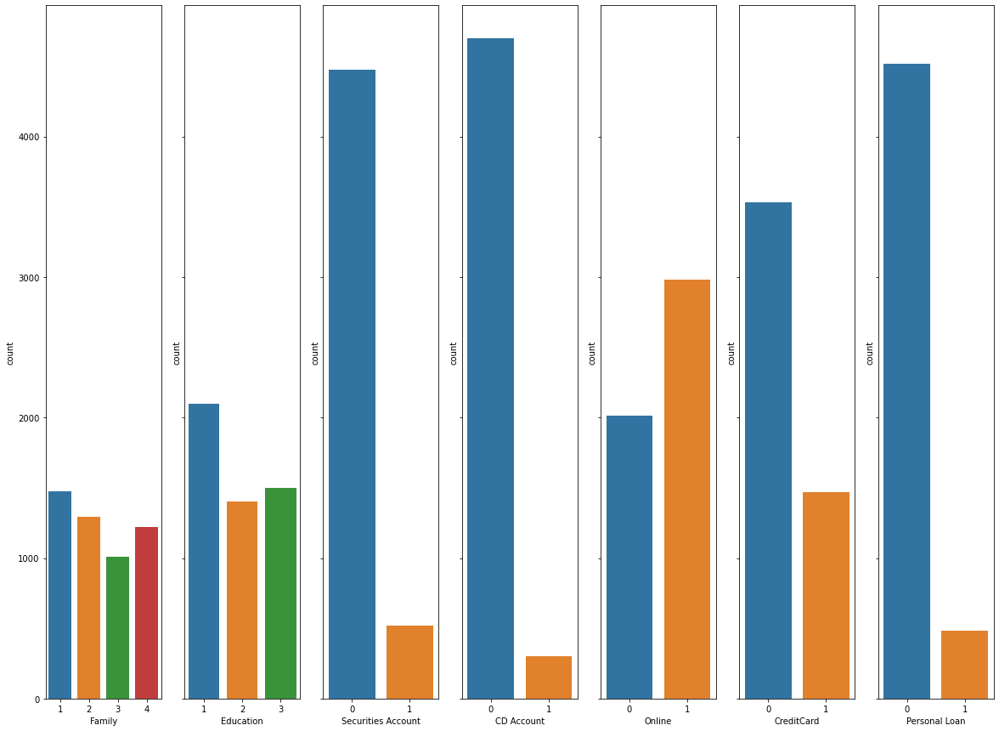

In [323]:
fig, axes = plt.subplots(1,len(categorical_cols),figsize=(20,15), sharex=False, sharey=True)
for i, column in enumerate(categorical_cols):
    #print(i,column)
    sns.countplot(thera_df[column],ax = axes[i])

<font color = 'blue'>
<ul>
<li>Family, Education, Online and Credit card are relatively well distributed across their values</li>
<li> Securities Account, CD Account and Personal Loan are relatively more skewed</li>
</ul>
</font>

In [314]:
pd.crosstab(thera_df.Family, thera_df.Education, margins=True)

Education,1,2,3,All
Family,,,,
1,678,326,468,1472
2,657,265,374,1296
3,349,383,278,1010
4,412,429,381,1222
All,2096,1403,1501,5000


### Inspect Non Categorical Columns

In [315]:
# Which columns have zeros
thera_df.loc[:,non_categorical_cols].apply(lambda x: x.isin([0]).any())

Age           False
Experience     True
Income        False
ZIP Code      False
CCAvg          True
Mortgage       True
dtype: bool

In [316]:
thera_df.loc[:,non_categorical_cols].describe()

,Age,Experience,Income,ZIP Code,CCAvg,Mortgage
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,45.338400,20.104600,73.774200,93152.503000,1.937938,56.498800
std,11.463166,11.467954,46.033729,2121.852197,1.747659,101.713802
min,23.000000,-3.000000,8.000000,9307.000000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,91911.000000,0.700000,0.000000
50%,45.000000,20.000000,64.000000,93437.000000,1.500000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,2.500000,101.000000
max,67.000000,43.000000,224.000000,96651.000000,10.000000,635.000000


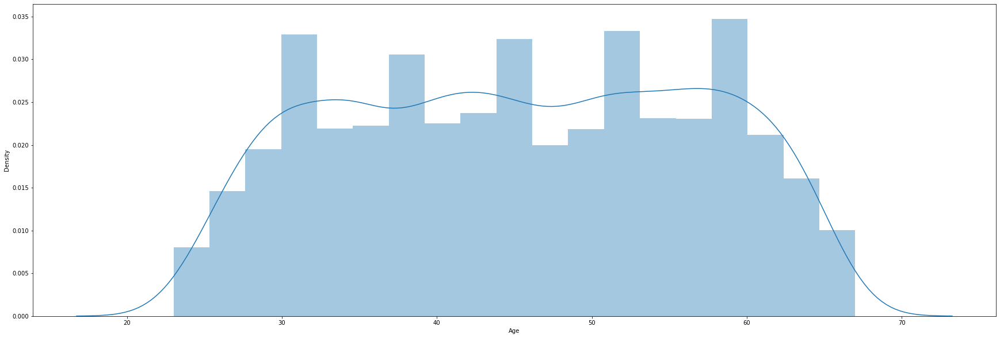

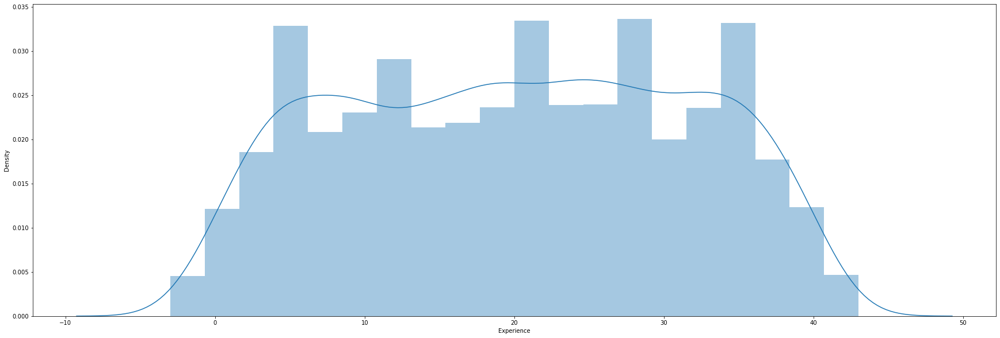

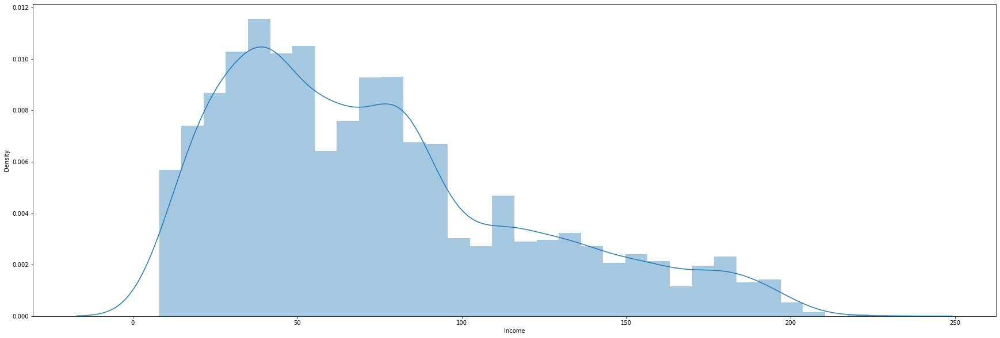

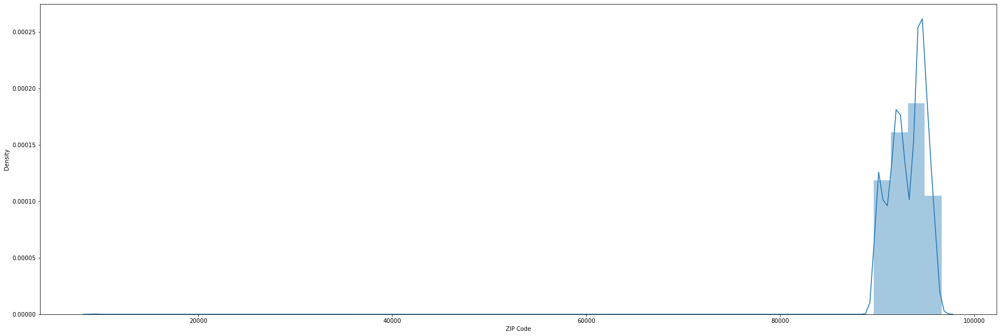

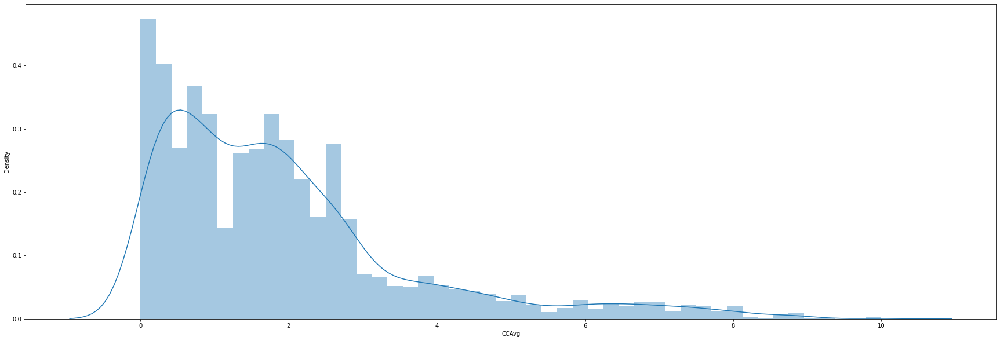

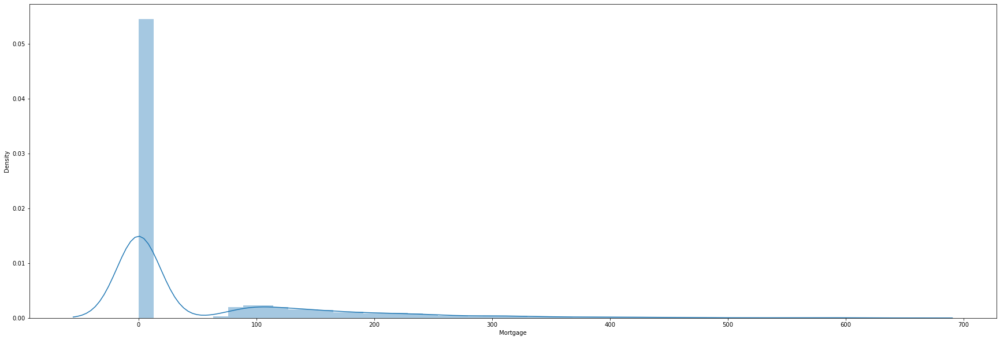

In [317]:

for i,column in enumerate(non_categorical_cols):
    plt.figure(figsize=(30,10))
    sns.distplot(thera_df[column])
    plt.show()
    

<font color = 'blue'>
<ul>
<li>Experience, CCAvg and Mortgage have 0 values</li>
<li>Age, Experience are uniformly distributed mean ~= median</li>
<li> Income is right skewed</li>
<li>CC Avg is right skewed</li>
<li>Mortage is highly skewed to the right - this may impact the model and best to run model with and without this variable</li>
</ul>
</font>

In [318]:
thera_df[thera_df['Experience'] == 0]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,,
106,24,0,35,94704,3,0.1,2,0,0,1,0,1,0
152,26,0,132,92834,3,6.5,3,0,1,0,0,0,1
156,24,0,60,94596,4,1.6,1,0,0,0,0,1,0
157,26,0,15,92131,4,0.4,1,0,0,0,0,0,1
161,29,0,134,95819,4,6.5,3,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4875,26,0,75,94061,3,0.3,3,0,0,0,0,0,0
4902,26,0,54,96094,3,1.1,2,0,0,0,0,1,0
4935,26,0,85,93950,2,1.6,3,0,0,0,0,1,1


In [319]:
thera_df[thera_df['CCAvg'] == 0]


,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,,
64,42,17,32,94523,4,0.0,2,0,0,0,0,1,0
129,38,14,74,92182,2,0.0,1,0,0,1,0,1,0
199,27,3,59,94123,4,0.0,1,90,0,1,0,1,0
211,51,26,20,92131,2,0.0,1,0,0,0,0,0,0
216,38,14,92,95818,2,0.0,1,249,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4802,34,10,88,94404,2,0.0,1,121,0,0,0,1,0
4827,56,31,81,93943,2,0.0,3,225,0,0,0,0,0
4838,36,10,183,95348,2,0.0,1,0,0,0,0,0,0


In [320]:
thera_df[thera_df['Mortgage'] == 0]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,,
1,25,1,49,91107,4,1.6,1,0,0,1,0,0,0
2,45,19,34,90089,3,1.5,1,0,0,1,0,0,0
3,39,15,11,94720,1,1.0,1,0,0,0,0,0,0
4,35,9,100,94112,1,2.7,2,0,0,0,0,0,0
5,35,8,45,91330,4,1.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,64,40,75,94588,3,2.0,3,0,0,0,0,1,0
4996,29,3,40,92697,1,1.9,3,0,0,0,0,1,0
4998,63,39,24,93023,2,0.3,3,0,0,0,0,0,0


In [321]:
print(f'''No of customers with no credit card spending: {thera_df[thera_df.CCAvg==0].shape[0]}\n
No of customers with no mortgages: {thera_df[thera_df.Mortgage==0].shape[0]}''')

No of customers with no credit card spending: 106

No of customers with no mortgages: 3462


<font color = 'blue'>
<ul>
<li>Customers with no credit card spending: 106</li>
<li>Customers with no mortgages: 3462</li>
<li>This reinforces our finding that Mortgage is highly skewed</li>
</ul>
</font>

### Bivariate Inspections

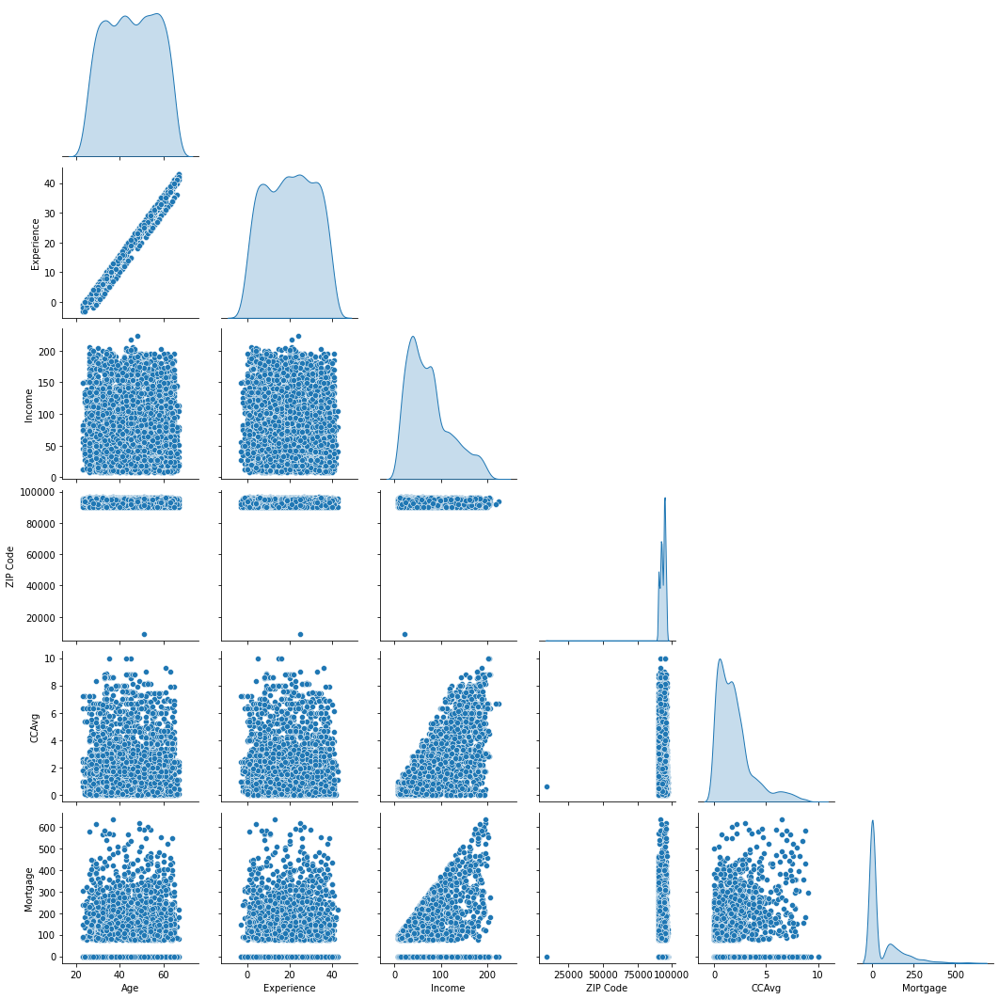

In [416]:
sns.pairplot(thera_df, corner=True, diag_kind='kde')

<AxesSubplot:>

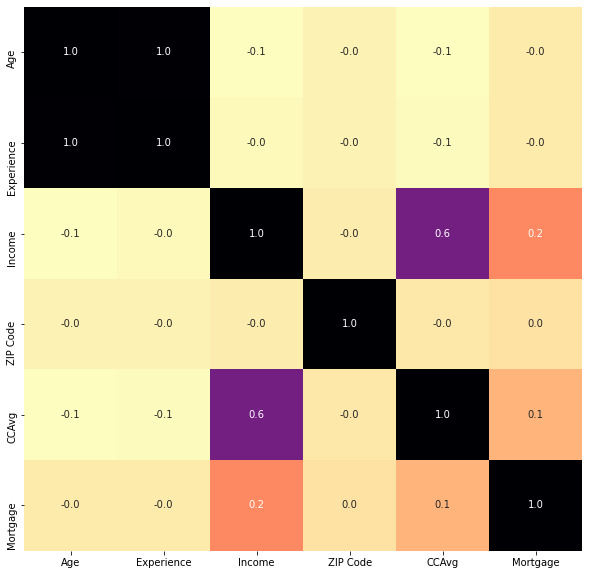

In [324]:
plt.figure(figsize=(10,10))
sns.heatmap(thera_df.corr(), annot=True, fmt='.1f', cmap='magma_r', cbar=False)

In [352]:
thera_df.groupby("Personal Loan").median()

,Age,Experience,Income,ZIP Code,CCAvg,Mortgage
Personal Loan,,,,,,
0,45.0,20.0,59.0,93437.0,1.4,0.0
1,45.0,20.0,142.5,93407.0,3.8,0.0


In [353]:
thera_df.groupby("Personal Loan").mean()

,Age,Experience,Income,ZIP Code,CCAvg,Mortgage
Personal Loan,,,,,,
0,45.367257,20.132301,66.237389,93152.428761,1.729009,51.789381
1,45.066667,19.843750,144.745833,93153.202083,3.905354,100.845833


<font color ='blue'>
<ul>
<li>The only apparent strong correlations are Age with Experience and Income with CCAvg</li>
<li>There is also a relationship with increase in income and increase in mortgage evident in the plot - however since mortgage is a very skewed variable, the overall correlation is low</li>
<li>Customers with Personal Loan have higher income that those without</li>
<li>Customers with Personal Loan have higher CCAvg that those without</li>
<li>Customers with Personal Loan have bigger mortages than those without, however since mortgage is such a skewed variable, the median in both instances is the same</li>
</ul>
</font>

In [403]:
x = {}
for column in categorical_cols[:-1]:
    #print(pd.crosstab(thera_df["Personal Loan"], thera_df[column], normalize='columns', margins=True).to_string(),'\n')
    x[column] = pd.crosstab(thera_df["Personal Loan"], thera_df[column], normalize='columns', margins=True)
    display(x[column])
    print('\n')



Family,1,2,3,4,All
Personal Loan,,,,,
0,0.92731,0.91821,0.868317,0.890344,0.904
1,0.07269,0.08179,0.131683,0.109656,0.096


Education,1,2,3,All
Personal Loan,,,,
0,0.95563,0.870278,0.863424,0.904
1,0.04437,0.129722,0.136576,0.096


Securities Account,0,1,All
Personal Loan,,,
0,0.906208,0.885057,0.904
1,0.093792,0.114943,0.096


CD Account,0,1,All
Personal Loan,,,
0,0.927629,0.536424,0.904
1,0.072371,0.463576,0.096


Online,0,1,All
Personal Loan,,,
0,0.90625,0.90248,0.904
1,0.09375,0.09752,0.096


CreditCard,0,1,All
Personal Loan,,,
0,0.904533,0.902721,0.904
1,0.095467,0.097279,0.096


<font color='blue'>
<ul>
<li>Increase in customers with Personal Loan with increase in: Education, Family (although a dip is seen as family size increases from 3 to 4)</li>
<li>More customers with Personal Loan when they also have: Securities Account, CD Account (more pronounced) </li>
<li>No significant effect with Online, Credit Card</li>
</ul>
</font>


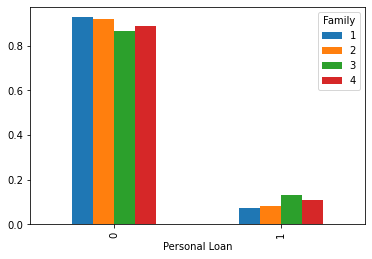

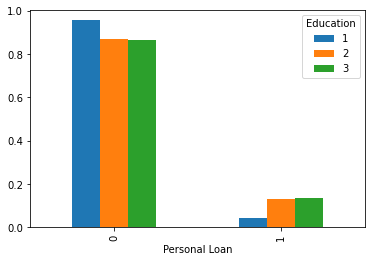

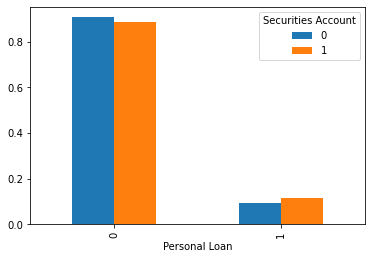

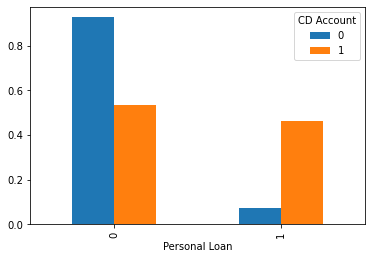

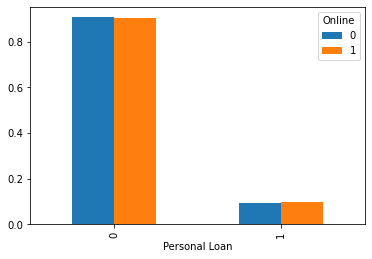

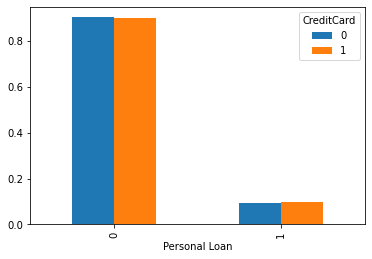

In [414]:
for key in x:
    x[key].drop('All', axis=1).plot(kind='bar')


## Modelling

In [327]:
from sklearn.model_selection import train_test_split

X = thera_df.drop('Personal Loan', axis=1)
X_cols = X.columns
y = thera_df['Personal Loan']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

X_train.head()
print(X_cols)


Index(['Age', 'Experience', 'Income', 'ZIP Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Securities Account', 'CD Account', 'Online',
       'CreditCard'],
      dtype='object')


In [328]:
print("{0:0.2f}% data is in training set".format((len(X_train)/len(thera_df.index)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(thera_df.index)) * 100))

70.00% data is in training set
30.00% data is in test set


In [329]:
print("Original Personal Loan True Values    : {0} ({1:0.2f}%)".format(len(thera_df.loc[thera_df['Personal Loan'] == 1]), (len(thera_df.loc[thera_df['Personal Loan'] == 1])/len(thera_df.index)) * 100))
print("Original Personal Loan True Values    : {0} ({1:0.2f}%)".format(len(thera_df.loc[thera_df['Personal Loan'] == 0]), (len(thera_df.loc[thera_df['Personal Loan'] == 0])/len(thera_df.index)) * 100))
print("\n")
print("Training Personal Loan True Values    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Personal Loan False Values   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Personal Loan True Values        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Personal Loan False Values       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Original Personal Loan True Values    : 480 (9.60%)
Original Personal Loan True Values    : 4520 (90.40%)


Training Personal Loan True Values    : 331 (9.46%)
Training Personal Loan False Values   : 3169 (90.54%)

Test Personal Loan True Values        : 149 (9.93%)
Test Personal Loan False Values       : 1351 (90.07%)



<font color='blue'>
<ul>
<li>Our data seems uniformly split with ratio of target variable values broadly similar across the dataset, training set and test set</li>
</ul>
</font>


In [447]:
from sklearn import metrics, svm
from sklearn.metrics import recall_score, roc_auc_score, classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression

# Fit the model on train
model = LogisticRegression(solver='liblinear',verbose=0)
model.fit(X_train, y_train)
#predict on test
y_predict = model.predict(X_test)


coef_df = pd.DataFrame(model.coef_, columns=X_cols)
coef_df['intercept'] = model.intercept_
print('The coefficients predicted by the model are:')
coef_df.sort_values(by=0)

The coefficients predicted by the model are:


,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,intercept
0,-0.000528,-0.00201,0.036089,-0.000066,0.015165,0.009454,0.016447,0.000833,0.000534,0.004681,-0.000177,-0.000067,-0.000106


In [469]:
## Feature Importance or Coefficients 
fi = pd.DataFrame()
fi['Col'] = X_train.columns
fi['Coeff'] = np.round(abs(model.coef_[0]),3)
fi.sort_values(by='Coeff',ascending=False)


,Col,Coeff
2,Income,0.036
6,Education,0.016
4,Family,0.015
5,CCAvg,0.009
9,CD Account,0.005
1,Experience,0.002
0,Age,0.001
7,Mortgage,0.001
8,Securities Account,0.001
3,ZIP Code,0.000


In [331]:
model_score = model.score(X_test, y_test)
print(model_score)

0.9073333333333333


In [448]:
y_test.value_counts(normalize=True)

0    0.900667
1    0.099333
Name: Personal Loan, dtype: float64

<font color='blue'>
Broadly predicted values have similar split in target variable as in the observed data
</font>

<Figure size 3000x3000 with 0 Axes>

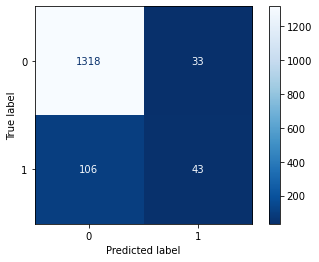

In [333]:
plt.figure(figsize=(10,10), dpi=300)
metrics.plot_confusion_matrix(model, X_test, y_test, cmap='Blues_r')

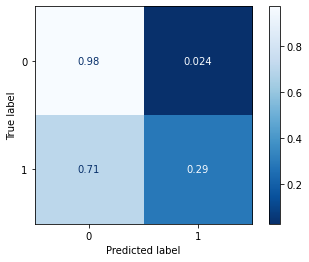

In [334]:
metrics.plot_confusion_matrix(model, X_test, y_test, cmap='Blues_r', normalize='true')

<AxesSubplot:>

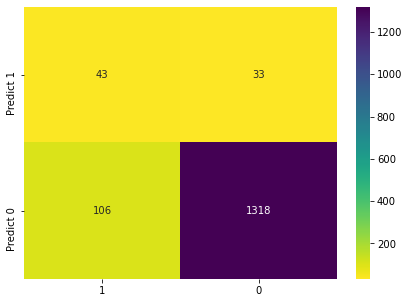

In [335]:
cm=metrics.confusion_matrix(y_test, y_predict, labels=[1, 0])

df_cm = pd.DataFrame(cm.T, columns = [i for i in ["1","0"]],
                  index = [i for i in ["Predict 1","Predict 0"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='.0f', cmap='viridis_r')

In [456]:
x={'model_auc':metrics.roc_auc_score(y_test, y_predict),
'model_recall_sensitivity_TPR':recall_score(y_test,y_predict),
'model_accuracy':metrics.accuracy_score(y_test, y_predict),
'model_precision':metrics.precision_score(y_test, y_predict),
'model_f1':metrics.f1_score(y_test, y_predict),
'model_logloss':metrics.log_loss(y_test, y_predict)}
score_df = pd.DataFrame(x, index=['fullset'])
print('model metrics are:')
score_df

model metrics are:


,model_auc,model_recall,model_accuracy,model_precision,model_f1,model_logloss
fullset,0.632082,0.288591,0.907333,0.565789,0.382222,3.200611


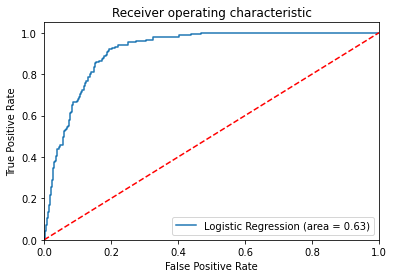

In [418]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [470]:
TP=cm.T[0,0]
TN=cm.T[1,1]
FP=cm.T[0,1]
FN=cm.T[1,0]

accuracy = (TP+TN)/ (TP+TN+FP+FN)
TPR = TP/(TP+FN)
TNR = TN/(TN+FP)
FPR = 1-TNR
precision = TP/ (TP+FP)
F1 = 2*TPR*precision/(TPR+precision)

metrics_d = {
    'accuracy': accuracy,
    'TPR': TPR,
    'Specificity_TNR': TNR,
    'FPR': FPR,
    'precision': precision,
    'F1': F1
}


manual_score_df = pd.DataFrame(metrics_d,index=[0])
manual_score_df

,accuracy,TPR,Specificity_TNR,FPR,precision,F1
0,0.907333,0.288591,0.975574,0.024426,0.565789,0.382222


In [420]:
print('The confusion matrix')

print(f'True Positives (TP): we correctly predicted that take a Personal Loan {TP}')

print(f'True Negatives (TN): we correctly predicted that take a Personal Loan {TN}')

print(f'False Positives (FP): we incorrectly predicted that they take a Personal Loan (a "Type I error") {FP}')

print(f'False Negatives (FN): we incorrectly predicted that they dont take a Personal Loan (a "Type II error") {FN}')
print(f'metrics: {metrics_d}')

The confusion matrix
True Positives (TP): we correctly predicted that take a Personal Loan 43
True Negatives (TN): we correctly predicted that take a Personal Loan 1318
False Positives (FP): we incorrectly predicted that they take a Personal Loan (a "Type I error") 33
False Negatives (FN): we incorrectly predicted that they dont take a Personal Loan (a "Type II error") 106
metrics: {'accuracy': 0.9073333333333333, 'TPR': 0.28859060402684567, 'TNR': 0.9755736491487786, 'FPR': 0.024426350851221357, 'precision': 0.5657894736842105, 'F1': 0.38222222222222224}


In [345]:
X_test.loc[y_test!=y_predict]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,
1514,45,21,183,95211,2,1.4,1,354,0,0,0,0
4378,33,8,145,92507,1,2.7,3,0,0,0,1,0
3989,59,35,85,91330,1,3.4,3,0,0,1,0,1
3272,52,27,93,90291,4,4.1,2,0,0,0,0,1
350,26,2,60,93407,2,3.0,1,132,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4564,28,2,188,92350,2,4.5,1,0,1,0,1,0
352,28,4,155,92182,4,5.3,2,0,0,0,1,0
422,28,3,115,92333,4,3.1,2,0,0,0,0,0


In [346]:
comparison_df = X_test.copy()
comparison_df

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard
ID,,,,,,,,,,,,
2765,31,5,84,91320,1,2.90,3,105,0,0,0,1
4768,35,9,45,90639,3,0.90,1,101,1,0,0,0
3815,34,9,35,94304,3,1.30,1,0,0,0,0,0
3500,49,23,114,94550,1,0.30,1,286,0,0,1,0
2736,36,12,70,92131,3,2.60,2,165,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4141,63,38,32,94015,1,1.50,2,0,0,0,0,0
3970,38,11,75,94305,3,2.33,2,0,0,0,1,0
2536,50,25,21,90274,2,0.70,3,129,0,0,0,0


In [347]:
comparison_df['Observed Personal Loan'] = y_test
comparison_df

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,Observed Personal Loan
ID,,,,,,,,,,,,,
2765,31,5,84,91320,1,2.90,3,105,0,0,0,1,0
4768,35,9,45,90639,3,0.90,1,101,1,0,0,0,0
3815,34,9,35,94304,3,1.30,1,0,0,0,0,0,0
3500,49,23,114,94550,1,0.30,1,286,0,0,1,0,0
2736,36,12,70,92131,3,2.60,2,165,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4141,63,38,32,94015,1,1.50,2,0,0,0,0,0,0
3970,38,11,75,94305,3,2.33,2,0,0,0,1,0,0
2536,50,25,21,90274,2,0.70,3,129,0,0,0,0,0


In [348]:
comparison_df['Predicted Personal Loan'] = y_predict
comparison_df

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,Observed Personal Loan,Predicted Personal Loan
ID,,,,,,,,,,,,,,
2765,31,5,84,91320,1,2.90,3,105,0,0,0,1,0,0
4768,35,9,45,90639,3,0.90,1,101,1,0,0,0,0,0
3815,34,9,35,94304,3,1.30,1,0,0,0,0,0,0,0
3500,49,23,114,94550,1,0.30,1,286,0,0,1,0,0,0
2736,36,12,70,92131,3,2.60,2,165,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4141,63,38,32,94015,1,1.50,2,0,0,0,0,0,0,0
3970,38,11,75,94305,3,2.33,2,0,0,0,1,0,0,0
2536,50,25,21,90274,2,0.70,3,129,0,0,0,0,0,0


In [349]:
comparison_df[comparison_df['Observed Personal Loan'] != comparison_df['Predicted Personal Loan']]

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,Observed Personal Loan,Predicted Personal Loan
ID,,,,,,,,,,,,,,
1514,45,21,183,95211,2,1.4,1,354,0,0,0,0,0,1
4378,33,8,145,92507,1,2.7,3,0,0,0,1,0,1,0
3989,59,35,85,91330,1,3.4,3,0,0,1,0,1,1,0
3272,52,27,93,90291,4,4.1,2,0,0,0,0,1,1,0
350,26,2,60,93407,2,3.0,1,132,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4564,28,2,188,92350,2,4.5,1,0,1,0,1,0,0,1
352,28,4,155,92182,4,5.3,2,0,0,0,1,0,1,0
422,28,3,115,92333,4,3.1,2,0,0,0,0,0,1,0


<font color='blue'>
<h3>Observations</h3>
<ul>
<li>Based on the dataset, we are able to build a model with a relatively high score that can predict whether or not a customer will take a Personal Loan</li>
</ul>
</font>

In [428]:
X2 = X.drop('Mortgage', axis = 1)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2,y,test_size=0.3, random_state=1)
y2_train

ID
1335    0
4769    0
66      0
178     0
4490    0
       ..
2896    0
2764    0
906     0
3981    0
236     0
Name: Personal Loan, Length: 3500, dtype: category
Categories (2, int64): [0, 1]

In [430]:
model2 = LogisticRegression(solver='liblinear',verbose=1)
model2.fit(X2_train, y2_train)
#predict on test
y2_predict = model2.predict(X2_test)

[LibLinear]

In [435]:
x2={'model_auc':metrics.roc_auc_score(y2_test, y2_predict),
'model_recall':recall_score(y2_test,y2_predict),
'model_accuracy':metrics.accuracy_score(y2_test, y2_predict),
'model_precision':metrics.precision_score(y2_test, y2_predict),
'model_f1':metrics.f1_score(y2_test, y2_predict),
'model_logloss':metrics.log_loss(y2_test, y2_predict)}

In [461]:
score_df2=pd.DataFrame(x2,index=['no mortgage'])
pd.concat([score_df,score_df2])

,model_auc,model_recall,model_accuracy,model_precision,model_f1,model_logloss
fullset,0.632082,0.288591,0.907333,0.565789,0.382222,3.200611
no mortgage,0.631712,0.288591,0.906667,0.558442,0.380531,3.223637


<font color = blue>
On every metric the model is aided by inclusion of Mortgage as an independent variable even thought it's highly skewed
<br>
<br>
<h3>Business understanding</h3>


</font>

## Remember

    mktg campaign so false negative more costly</font>


#### Confusion matrix observations

* True Positive (observed=1,predicted=1): 43

    * In the test set, the model __correctly__ predicted 43 customers would take a Personal Loan 

* False Positive (observed=0,predicted=1): 33

    * In the test set, the model __incorrectly__ predicted 33 customers would take a Personal Loan 

* True Negative (observed=0,predicted=0): 1,318

    * In the test set, the model __correctly__ predicted 1318 customers would not take a Personal Loan 

* False Negative (observed=1,predicted=0): 106

    * In the test set, the model __incorrectly__ predicted 106 customers would not take a Personal Loan 


#### Feature Importance

* Income, Education, Family, CCAvg are the top 4 features which influence the model's output (based on the coefficients).

* ZIP Code, Online, CreditCard have negligible influence on the model (~0) 

* CD Account, Experience, Age, Mortgage, Securities Account have very little influence but as we see in the analysis for Mortgage, there may be some utility in keeping these variables


#### Important Metric
* In this scenario the bank wants to find those who are likely to take a Personal Loan based on the customers' other relationships with the bank as well as other data the bank has on the customers such as age
* The aim is to target marketing at the most likely customers - marketing budgets are limited and most effective use would be to focus on groups that will most likely take the loan
* Presumably there will be another credit appraisal process but that is not being investigated here
* In a marketing campaign, the bank would want to reach as many eligible customers as possible while not broadening the scope so much that ad spends are wasted on unlikely customers
* 
* Here the bank wants to give loan to the people who are eligible for the home loan i.e. less number of False Positive, if FP is high bank would lose money. So that the bank doesn't lose money on the people who are not eligible for the loan. Hence Precision is the important metric.

In case of False negative bank will lose few customers but that okay because the bank would want to retain money more than customers who are not eligible for loan.

After achieving the desired accuracy we can deploy the model for practical use. As in the bank now can predict who is eligible for home loan. They can use the model for upcoming customers.
</p>
</font>

# Thera Bank Personal Loan Campaign
 
## Data Description:

The dataset contains data on 5000 customers. The data include customer demographic information (age, income, etc.), the customer's relationship with the bank (mortgage, securities account, etc.), and the customer response to the last personal loan campaign (Personal Loan). Among these 5000 customers, only 480 (= 9.6%) accepted the personal loan that was offered to them in the earlier campaign.

 
## Domain:

Banking

 
## Context:

This case is about a bank (Thera Bank) whose management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors). A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio with a minimal budget.
Attribute Information:

    ID: Customer ID
    Age: Customer's age in completed years
    Experience: #years of professional experience
    Income: Annual income of the customer ($000)
    ZIP Code: Home Address ZIP
    Family: Family size of the customer
    CCAvg: Avg. spending on credit cards per month ($000)
    Education: Education Level. 1: Undergrad; 2: Graduate; 3: Advanced/Professional
    Mortgage: Value of house mortgage if any. ($000)
    Personal Loan: Did this customer accept the personal loan offered in the last campaign?
    Securities Account: Does the customer have a securities account with the bank?
    CD Account: Does the customer have a certificate of deposit (CD) account with the bank?
    Online: Does the customer use internet banking facilities?
    Credit card: Does the customer use a credit card issued by the bank?

 
## Learning Outcomes:

    Exploratory Data Analysis
    Preparing the data to train a model
    Training and making predictions using a classification model
    Model evaluation

 
## Objective:

The classification goal is to predict the likelihood of a liability customer buying personal loans.

 
## Steps and tasks:

    1.  Import the datasets and libraries, check datatype, statistical summary, shape, null values or incorrect imputation. (5 marks)
    2.  EDA: Study the data distribution in each attribute and target variable, share your findings (20 marks)

    * Number of unique in each column?
    * Number of people with zero mortgage?
    * Number of people with zero credit card spending per month?
    * Value counts of all categorical columns.
    * Univariate and Bivariate
    * Get data model ready

    3.  Split the data into training and test set in the ratio of 70:30 respectively (5 marks)
    4.  Use the Logistic Regression model to predict whether the customer will take a personal loan or not. Print all the metrics related to evaluating the model performance (accuracy, recall, precision, f1score, and roc_auc_score). Draw a heatmap to display confusion matrix (15 marks)

    5.  Find out coefficients of all the attributes and show the output in a data frame with column names? For test data show all the rows where the predicted class is not equal to the observed class. (10 marks)
    6.  Give conclusion related to the Business understanding of your model? (5 marks)
